# Stability at the 12m tower

From DTS (10min average) and sonics.

DTS stability were estimated using a log-linear Bayes GLM assuming that errors were distributed as Student's t distributions. These inferences were made in `estimating-stability_bayesian-stats.v2-2021-02-18.ipynb`

# Bias corrections for the csat temperatures -- Bayesian inference

Goals of the notebook:
- robustly identify periods with neutral stability using a Bayesian linear regression technique
- Conditionally sample the sonic anemometers according to the Bayesian regression and favorable meteorological conditions like full cloud cover
- Determine an offest correction for the sonic temperatures to remove biases
- Repeat using periods with cloud cover and low sensible heat fluxes

# 1. Import and formatting

In [64]:
# Data and methods libraries
import numpy as np
import xarray as xr
import scipy.stats
import pandas as pd

# OS interaction
import os

# import plotting
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import string
import datetime
import copy
import pymc3 as pm
import warnings

## Format plots

In [65]:
%matplotlib inline
# Higher resolution figures within the notebook
%config InlineBackend.figure_format = 'retina'

# Set the plot style from the seaborn library
sns.set_style("whitegrid")
context = 'paper'
sns.set_context(context)

# Define a default color palette, which should be fairly color blind friendly). The
# last purple is a bit similar to the blue for red blindness.
flatui = ["#3498db", "#FFBF00", "#34495e", "#95a5a6", "#e74c3c", "#9b59b6",]
sns.set_palette(sns.color_palette(flatui))

## Directories

In [66]:
dir_pre = os.path.join('/Users/karllapo/Dropbox/DarkMix/proj/DarkMix_Voitsumra/')

# Met data
dir_logger_data = os.path.join(dir_pre, 'logger_data')
dir_aws_data = os.path.join(dir_logger_data, 'AWS')
dir_csat_stats = os.path.join(dir_logger_data, 'CSATs', 'stats')
dir_csat_flux = os.path.join(dir_logger_data, 'CSATs', 'fluxes')
dir_csat_corr = os.path.join(dir_logger_data, 'CSATs', 'csat-Ts-correction')
dir_ceil = os.path.join(dir_pre, 'love_dts/ESSD-repository/remote-sensing/ceilometer/')
dir_press = os.path.join(dir_logger_data, 'pressure')
dir_bayes_glm = os.path.join(dir_pre, 'love_dts', 'bayes_glm')
dir_homogenized_data = os.path.join(dir_pre, 'homogenized_data')

# Figures
dir_print = os.path.join(dir_pre, 'figures', 'AncillaryMet')


# 2. Load data

## 2.1 Homogenized data

Use the homogenized data from `homogenizing-stability-data.ipynb`

In [92]:
os.chdir(dir_homogenized_data)

sonic_1min = xr.open_dataset('sonics_pot-temp_1min_qc_tower-subset.v1-2021-02-22.nc')
sonic_10min = xr.open_dataset('sonics_pot-temp_10min_qc_tower-subset.v1-2021-02-22.nc')
aws_2m_theta = xr.open_dataarray('aws_pot-temp_1min_qc_tower-subset.v1-2021-02-22.nc')
aws_2m_theta_10min = xr.open_dataarray('aws_pot-temp_10min_qc_tower-subset.v1-2021-02-22.nc')
tower = xr.open_dataset('tower_pot-temp_1s_qc_tower-subset.v1-2021-02-22.nc')
tower_1min = xr.open_dataset('tower_pot-temp_1min_qc_tower-subset.v1-2021-02-22.nc')


## 2.2 Tower 10min Bayesian modeling output

In [68]:
os.chdir(dir_bayes_glm)
tower_10min = xr.open_dataset('tower_10min_bayes_glm.nc')

## 2.2 Ceilometer, AWS, and pressure data

- Ceilometer for cloudiness
- AWS for radiation and RH
- pressure for potential temperature calculations

In [69]:
os.chdir(dir_ceil)
ceilo = xr.open_dataset('ceiolometer-combined-files_2019_June01-Aug15.nc')
ceilo = ceilo.reindex_like(sonic_1min_sub.time, method='nearest')
ceilo_10min = ceilo.interp_like(tower_10min.time, method='nearest')

In [102]:
os.chdir(dir_aws_data)
aws_10min = xr.open_dataset('AWS_Voi_10min.nc')

In [70]:
sonic_10min_sub['ols_m'] = (('time'), np.zeros(len(sonic_10min_sub.time.values)))
sonic_10min_sub['ols_r'] = (('time'), np.zeros(len(sonic_10min_sub.time.values)))
sonic_10min_sub['ols_p'] = (('time'), np.zeros(len(sonic_10min_sub.time.values)))
sonic_10min_sub['ols_b'] = (('time'), np.zeros(len(sonic_10min_sub.time.values)))


In [71]:
for t in sonic_10min_sub.time:
    ds = sonic_10min_sub.sel(time=t).theta

    result_dts = scipy.stats.linregress(np.log(ds.z), ds.values)
    sonic_10min_sub['ols_m'].loc[{'time': t}] = result_dts.slope
    sonic_10min_sub['ols_r'].loc[{'time': t}] = result_dts.rvalue
    sonic_10min_sub['ols_p'].loc[{'time': t}] = result_dts.pvalue
    sonic_10min_sub['ols_b'].loc[{'time': t}] = result_dts.intercept

In [73]:
dt = pd.date_range(
    start=pd.Timestamp(tower_10min.time[0].values),
    end=pd.Timestamp(tower_10min.time[-1].values),
    freq='10min',
)

tower_10min_nanfill = tower_10min.reindex(time=dt, tolerance=1, method='nearest')

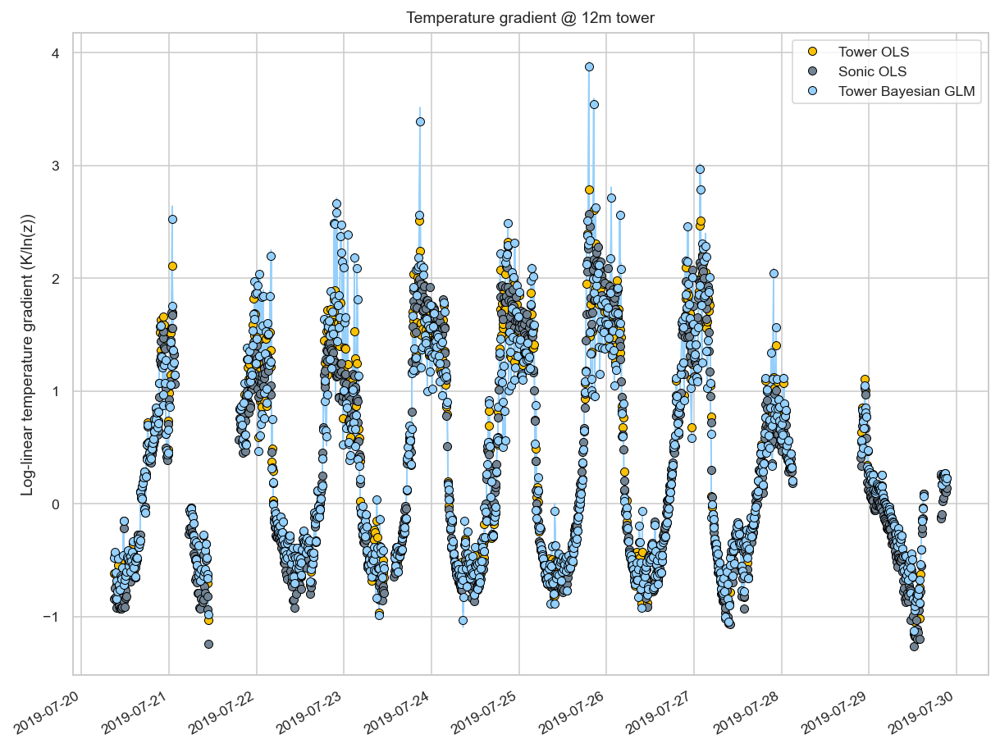

In [74]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

ax.fill_between(
    tower_10min_nanfill.time,
    tower_10min_nanfill.b1_slope.mean(dim='draws') + tower_10min_nanfill.b1_slope.std(dim='draws'),
    tower_10min_nanfill.b1_slope.mean(dim='draws') - tower_10min_nanfill.b1_slope.std(dim='draws'),
    color='xkcd:light blue'
)

ax.plot(
    tower_10min.time,
    tower_10min.ols_m,
    color='xkcd:goldenrod',
    marker='.',
    linestyle='None',
    label='Tower OLS',
    markeredgecolor='k',
    markeredgewidth=0.5,
    markersize=10,
)

ax.plot(
    sonic_10min_sub.time,
    sonic_10min_sub.ols_m,
    color='xkcd:steel',
    marker='.',
    linestyle='None',
    label='Sonic OLS',
    markeredgecolor='k',
    markeredgewidth=0.5,
    markersize=10,
)

ax.plot(
    tower_10min.time,
    tower_10min.b1_slope.mean(dim='draws'),
    color='xkcd:light blue',
    marker='.',
    linestyle='None',
    label='Tower Bayesian GLM',
    markeredgecolor='k',
    markeredgewidth=0.5,
    markersize=10,
)

ax.legend()
ax.set_ylabel('Log-linear temperature gradient (K/ln(z))')
ax.set_title('Temperature gradient @ 12m tower')
fig.autofmt_xdate()

### Comparing OLS to Bayes for DTS tower and sonics

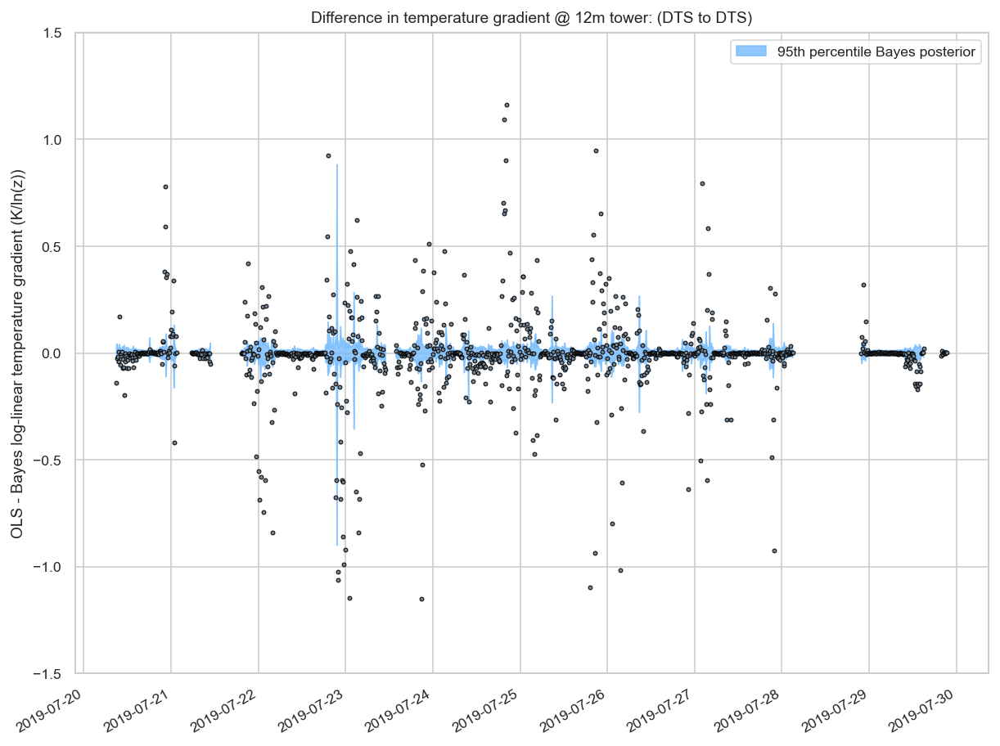

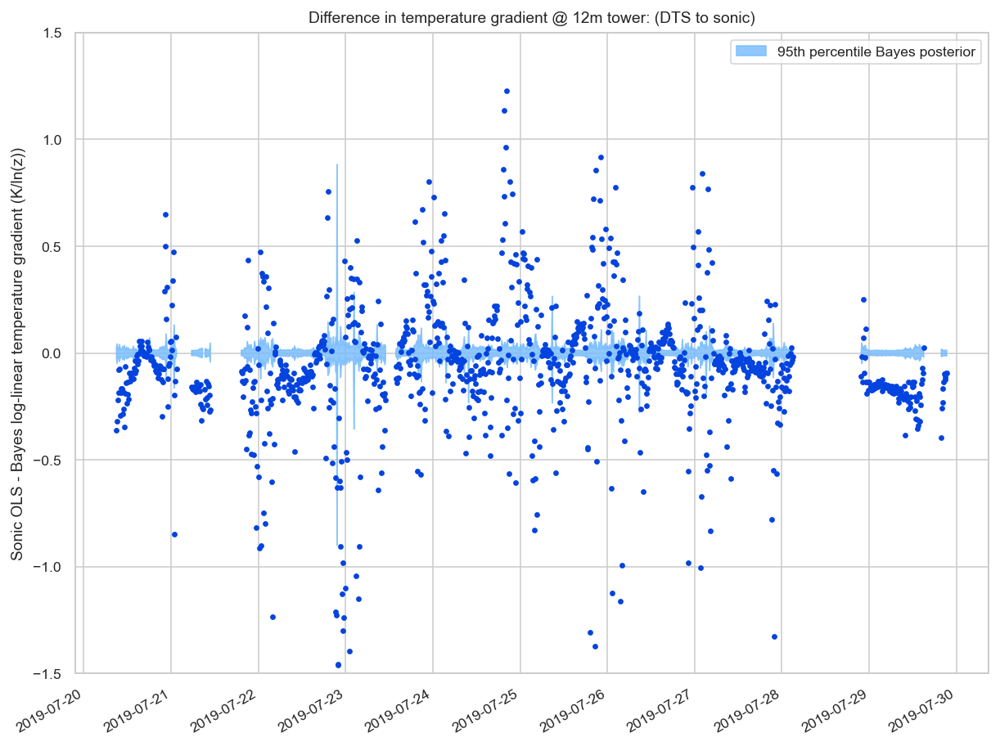

In [75]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

ax.fill_between(
    tower_10min_nanfill.time,
    (tower_10min_nanfill.b1_slope.mean(dim='draws') - tower_10min_nanfill.b1_slope).quantile(0.1, dim='draws'),
    (tower_10min_nanfill.b1_slope.mean(dim='draws') - tower_10min_nanfill.b1_slope).quantile(0.9, dim='draws'),
    color='xkcd:sky blue',
    label='95th percentile Bayes posterior',
    alpha=0.8
)
ax.plot(
    tower_10min.time,
    tower_10min.ols_m - tower_10min.b1_slope.mean(dim='draws'),
    color='xkcd:steel',
    markeredgecolor='k',
    markeredgewidth=0.5,
    marker='.',
    linestyle='None',
)

ax.set_ylim(-1.5, 1.5)
ax.legend()
ax.set_ylabel('OLS - Bayes log-linear temperature gradient (K/ln(z))')
ax.set_title('Difference in temperature gradient @ 12m tower: (DTS to DTS)')
fig.autofmt_xdate()

fig, ax = plt.subplots(1, 1, figsize=(10, 8))
ax.fill_between(
    tower_10min_nanfill.time,
    (tower_10min_nanfill.b1_slope.mean(dim='draws') - tower_10min_nanfill.b1_slope).quantile(0.1, dim='draws'),
    (tower_10min_nanfill.b1_slope.mean(dim='draws') - tower_10min_nanfill.b1_slope).quantile(0.9, dim='draws'),
    color='xkcd:sky blue',
    label='95th percentile Bayes posterior',
    alpha=0.8
)
ax.plot(
    tower_10min.time,
    sonic_10min_sub.ols_m - tower_10min.b1_slope.mean(dim='draws'),
    color='xkcd:blue',
    marker='.',
    linestyle='None',
)

ax.set_ylim(-1.5, 1.5)
ax.legend()
ax.set_ylabel('Sonic OLS - Bayes log-linear temperature gradient (K/ln(z))')
ax.set_title('Difference in temperature gradient @ 12m tower: (DTS to sonic)')
fig.autofmt_xdate()

Text(0.5, 0, "Mean Bayesian Student's GLM slope (K/ln(z))")

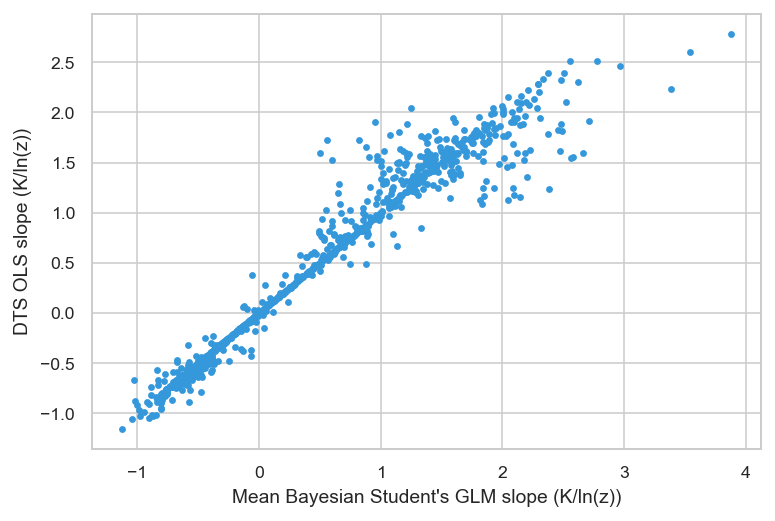

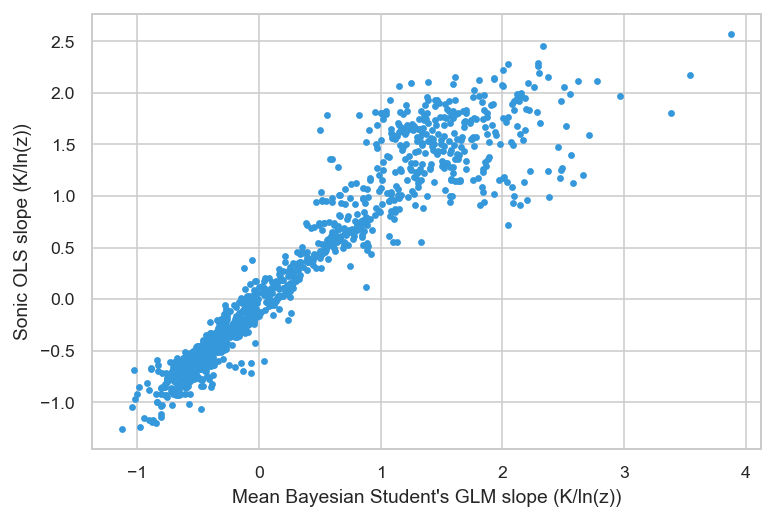

In [76]:
fig, ax = plt.subplots(1, 1)
ax.plot(tower_10min.b1_slope.mean(dim='draws').values, tower_10min.ols_m.values, linestyle='None', marker='.')
ax.set_ylabel('DTS OLS slope (K/ln(z))')
ax.set_xlabel('Mean Bayesian Student\'s GLM slope (K/ln(z))')

fig, ax = plt.subplots(1, 1)
ax.plot(tower_10min.b1_slope.mean(dim='draws').values, sonic_10min_sub.reindex_like(tower_10min, method='nearest', tolerance=0).ols_m.values, linestyle='None', marker='.')
ax.set_ylabel('Sonic OLS slope (K/ln(z))')
ax.set_xlabel('Mean Bayesian Student\'s GLM slope (K/ln(z))')

### Visualize the distribution of log-linear slopes

Text(0, 0.5, 'Counts (-)')

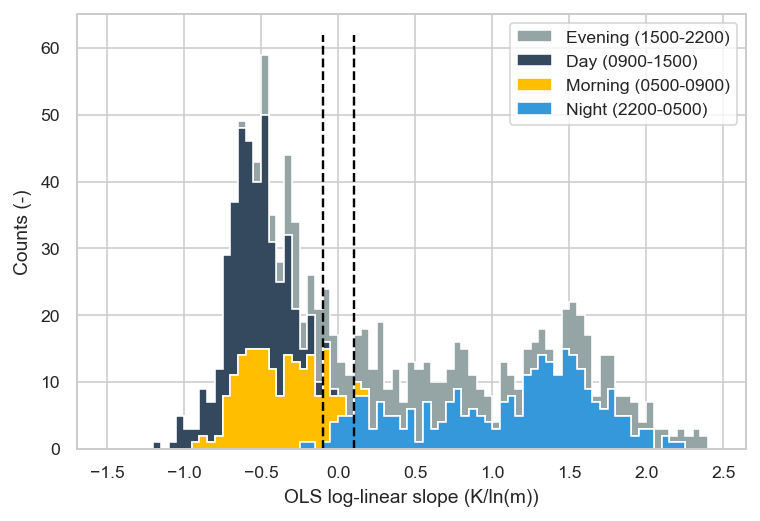

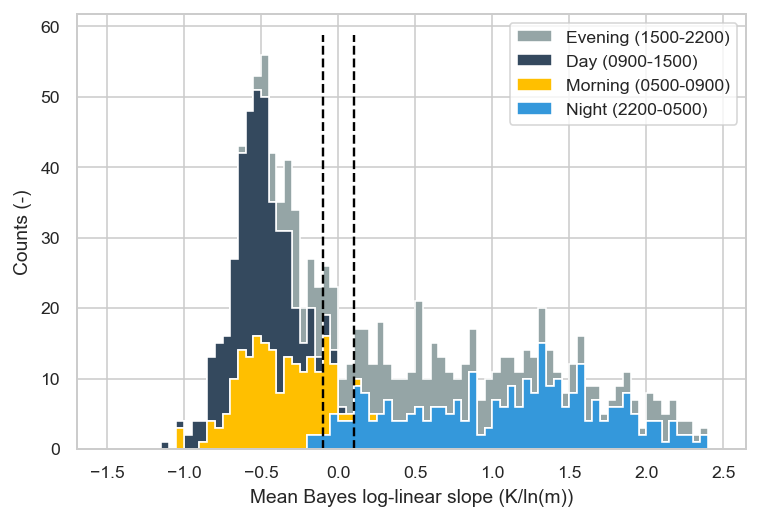

In [80]:
# OLS linear fit
plt.figure()
ds = tower_10min.ols_m
plt.hist([
    ds.where((ds['time.hour'] < 5) | (ds['time.hour'] > 22)),
    ds.where((ds['time.hour'] >= 5) & (ds['time.hour'] < 9)),
    ds.where((ds['time.hour'] >= 9) & (ds['time.hour'] < 15)),
    ds.where((ds['time.hour'] >= 15) & (ds['time.hour'] < 22)),
    ], 
    np.arange(-1.5, 2.5, 0.05),
    stacked=True,
    histtype='stepfilled',
    label=[
        'Night (2200-0500)',
        'Morning (0500-0900)',
        'Day (0900-1500)',
        'Evening (1500-2200)',
    ],
);
plt.legend()
ymax = plt.gca().get_ylim()[-1]
plt.plot([-0.1, -0.1], [0, ymax], 'k--')
plt.plot([0.1, 0.1], [0, ymax], 'k--')
plt.gca().set_xlabel('OLS log-linear slope (K/ln(m))')
plt.gca().set_ylabel('Counts (-)')

# Student's t-distribution
plt.figure()
ds = tower_10min.b1_slope.mean(dim='draws')
plt.hist([
    ds.where((ds['time.hour'] < 5) | (ds['time.hour'] > 22)),
    ds.where((ds['time.hour'] >= 5) & (ds['time.hour'] < 9)),
    ds.where((ds['time.hour'] >= 9) & (ds['time.hour'] < 15)),
    ds.where((ds['time.hour'] >= 15) & (ds['time.hour'] < 22)),
    ], 
    np.arange(-1.5, 2.5, 0.05),
    stacked=True,
    histtype='stepfilled',
    label=[
        'Night (2200-0500)',
        'Morning (0500-0900)',
        'Day (0900-1500)',
        'Evening (1500-2200)',
    ],
);
plt.legend()
ymax = plt.gca().get_ylim()[-1]
plt.plot([-0.1, -0.1], [0, ymax], 'k--')
plt.plot([0.1, 0.1], [0, ymax], 'k--')
plt.gca().set_xlabel('Mean Bayes log-linear slope (K/ln(m))')
plt.gca().set_ylabel('Counts (-)')

The dashed vertical lines represent what I am eyeballing as "near" neutral conditions. The Bayesian Student's t-distribution GLM results in less neutral conditions and shifts the distribution towards a longer tail toward stable conditions (+ slopes). Let's verify the

### The difference between the OLS and Student's t-distribution

When do we have the largest disagreements? Presumably from the time series it is during the night.

Text(0, 0.5, 'Counts (-)')

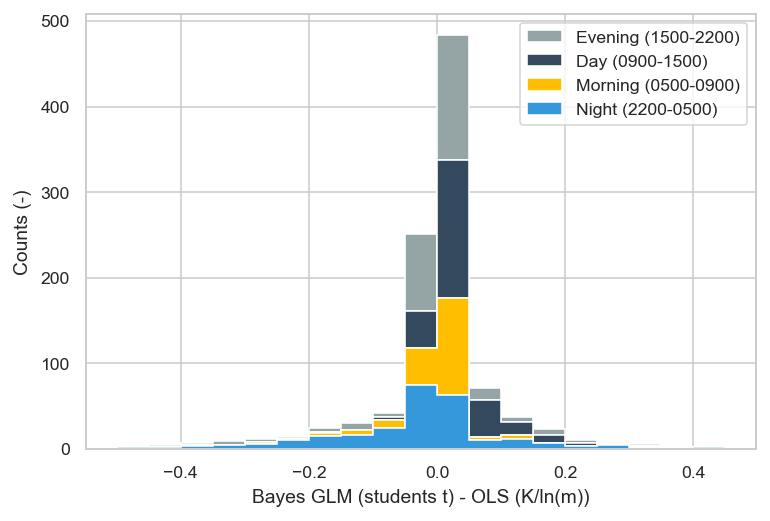

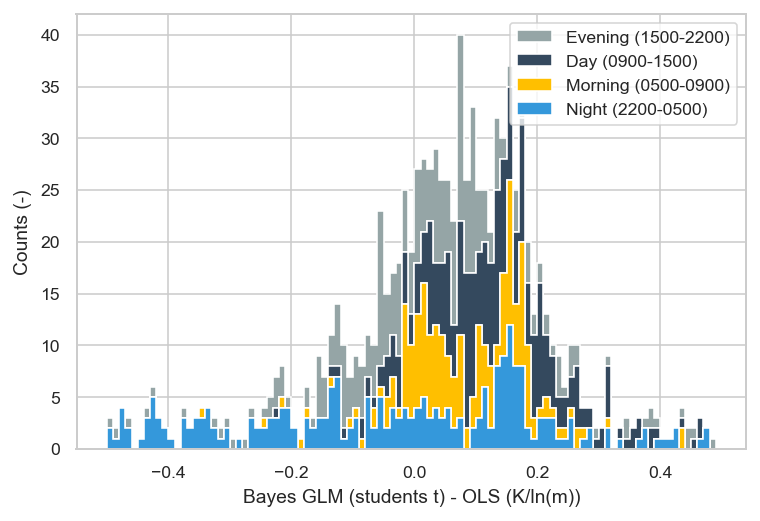

In [85]:
# DTS with varying fitting routines
plt.figure()
ds = tower_10min.b1_slope.mean(dim='draws') - tower_10min.ols_m
plt.hist([
    ds.where((ds['time.hour'] < 5) | (ds['time.hour'] > 22)),
    ds.where((ds['time.hour'] >= 5) & (ds['time.hour'] < 9)),
    ds.where((ds['time.hour'] >= 9) & (ds['time.hour'] < 15)),
    ds.where((ds['time.hour'] >= 15) & (ds['time.hour'] < 22)),
    ], 
    np.arange(-0.5, 0.5, 0.05),
    stacked=True,
    histtype='stepfilled',
    label=[
        'Night (2200-0500)',
        'Morning (0500-0900)',
        'Day (0900-1500)',
        'Evening (1500-2200)',
    ],
);
plt.legend()
ymax = plt.gca().get_ylim()[-1]
plt.gca().set_xlabel('Bayes GLM (students t) - OLS (K/ln(m))')
plt.gca().set_ylabel('Counts (-)')

# Sonic to DTS
plt.figure()
ds = tower_10min.b1_slope.mean(dim='draws') - sonic_10min_sub.reindex_like(tower_10min, method='nearest', tolerance=0).ols_m
plt.hist([
    ds.where((ds['time.hour'] < 5) | (ds['time.hour'] > 22)),
    ds.where((ds['time.hour'] >= 5) & (ds['time.hour'] < 9)),
    ds.where((ds['time.hour'] >= 9) & (ds['time.hour'] < 15)),
    ds.where((ds['time.hour'] >= 15) & (ds['time.hour'] < 22)),
    ], 
    np.arange(-0.5, 0.5, 0.01),
    stacked=True,
    histtype='stepfilled',
    label=[
        'Night (2200-0500)',
        'Morning (0500-0900)',
        'Day (0900-1500)',
        'Evening (1500-2200)',
    ],
);
plt.legend()
ymax = plt.gca().get_ylim()[-1]
plt.gca().set_xlabel('Bayes GLM (students t) - OLS (K/ln(m))')
plt.gca().set_ylabel('Counts (-)')



### Visualizing the distribution of slopes during neutral conditions

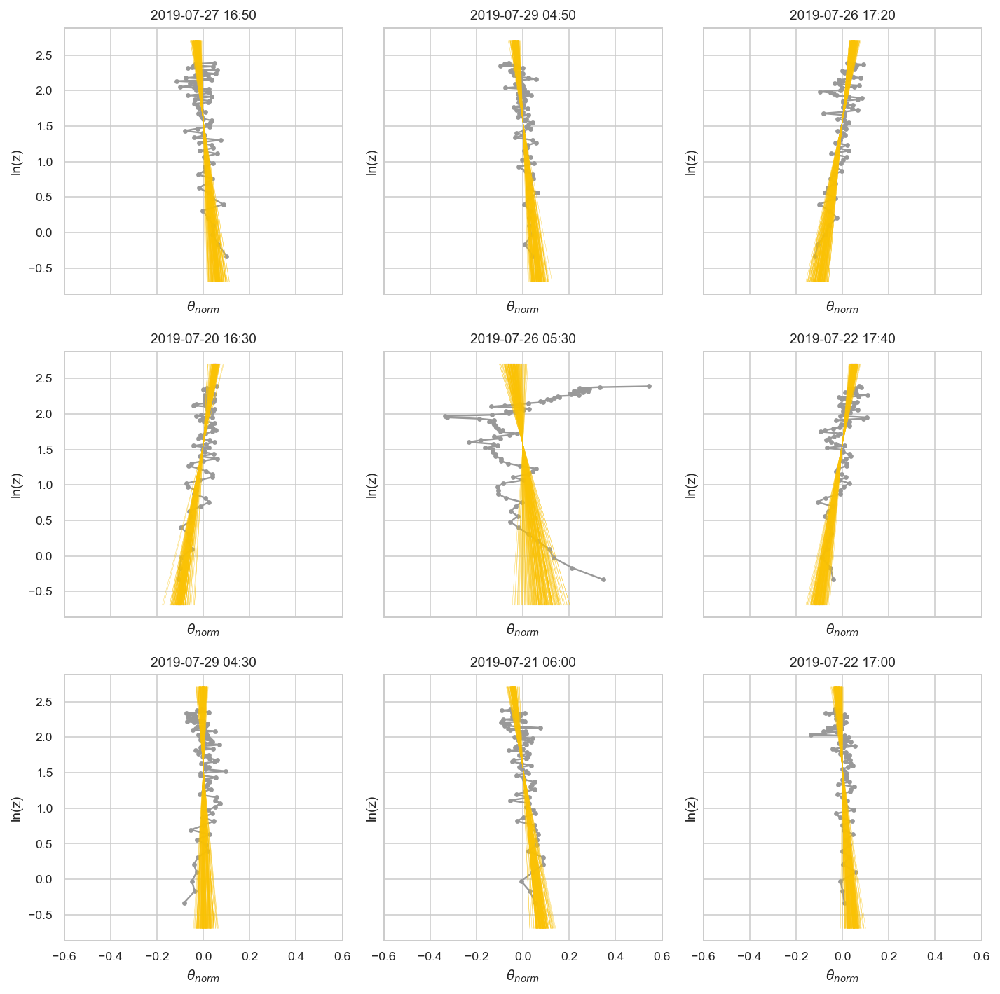

In [79]:
from numpy.random import default_rng

ind = (tower_10min.b1_slope.mean(dim='draws') < 0.05) & (tower_10min.b1_slope.mean(dim='draws') > -0.05)
ds = tower_10min.where(ind, drop=True)

rng = default_rng()
samp = rng.choice(len(ds.time.values), size=9, replace=False)

fig, axes = plt.subplots(3, 3, sharey=True, sharex=True, figsize=(10, 10))
axes = axes.flatten()

lm = lambda x, s: s["b0_intercept"].values + s["b1_slope"].values * x
lnz_eval = np.arange(np.log(0.5), np.log(15), 0.01)
lnz_normalize = ds.lnz.values
for ns, n in enumerate(samp):
    ax = axes[ns]
    dt = pd.Timestamp(ds.isel(time=n).time.values)
    ds_dt = ds.isel(time=n)
    y = ds_dt.lnz.values
    x = ds_dt.theta_mean_norm.values
    ax.plot(x, y, color='0.6', marker='.')

    for rand_loc in np.random.randint(0, len(tower_10min.draws), 200):
        rand_sample = ds.isel(time=n).isel(draws=rand_loc)
        ax.plot(
            lm(lnz_eval, rand_sample) - np.mean(lm(lnz_normalize, rand_sample)),
            lnz_eval,
            color='xkcd:goldenrod',
            alpha=0.8,
            lw=0.2,
        )
        
    ax.plot(
        ds.ols_b.isel(time=n).values + ds.ols_m.isel(time=n).values * lnz_eval,
        lnz_eval,
        color='k', lw=0.8, ls='--')
    
    ax.set_title(dt.strftime('%Y-%m-%d %H:%M'))
    ax.set_ylabel('ln(z)')
    ax.set_xlabel(r'$\theta_{norm}$')
    ax.set_xlim(-0.6, 0.6)
fig.tight_layout()

Periods with obvious sublayers are still fairly porrly fit. But in general this gives the results I would intuitively expect.

# Evaluate the CSAT temperatures

CSAT sonic temperatures were converted to air temperature in the homogenization data preparation script. During neutrally stable conditions, we would expect that the CSATs should also have a flat/neutral profile. Any deviation away from neutral is indicative of a bias. Using this logic we can bias correct our CSATs after the fact. While a rigorous instrument intercomparison pre- or post-campaign would have been preferable, this approach will reduce the uncertainty in the CSAT temperatures substantially.

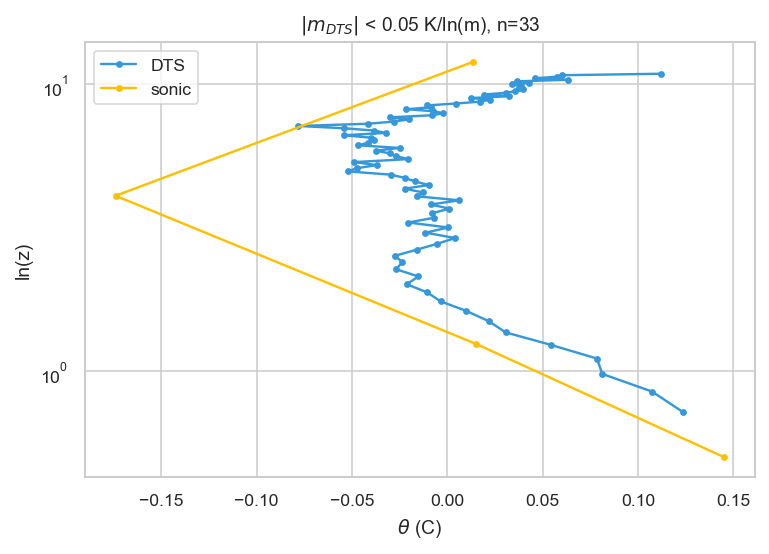

In [86]:
ind = (tower_10min.b1_slope.mean(dim='draws') < 0.05) & (tower_10min.b1_slope.mean(dim='draws') > -0.05)

fig, ax = plt.subplots(1, 1)

ax.semilogy(
    tower_10min.theta_mean_norm.where(ind).mean(dim='time'), 
    tower_10min.z,
    marker='.',
    label='DTS'
)
ax.semilogy(
    sonic_10min_sub.theta.where(ind).mean(dim='time') - sonic_10min_sub.theta.where(ind).mean(dim='time').swap_dims({'names': 'z'}).mean(dim='z'),
    sonic_10min_sub.z,
    marker='.',
    label='sonic'
)

ax.set_ylabel('ln(z)')
ax.set_xlabel(r'$\theta$ (C)')
ax.set_title(r'$|m_{{DTS}}|$ < 0.05 K/ln(m), n={}'.format(ind.sum(dim='time').values))
ax.legend()

The shape of the sonics and DTS seems to align overall. But, given the results above, I am left wondering how much these results are informed by periods with poor linear fits from artifacts from the fiber holders at the top and bottom of the profiles.

Artifacts can be largely removed by imposing the restriction that cloud cover is nearly complete, which reduces the occurrence of radiative artifacts.

Let's select for periods where I have greater confidence in the DTS signal giving us a neutral boundary layer with the additional constraint that the total cloud cover >= 7/8 (as observed by the ceilometer).

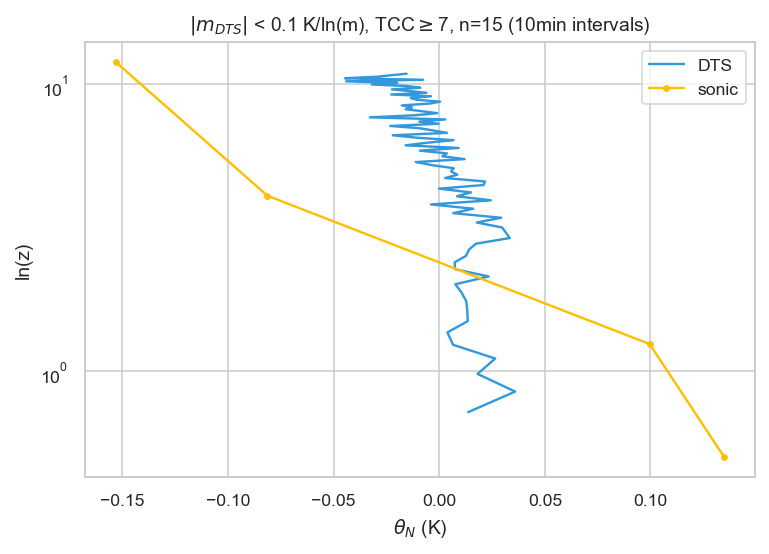

In [117]:
ind = (tower_10min.b1_slope.mean(dim='draws') < 0.05) & (tower_10min.b1_slope.mean(dim='draws') > -0.05) & (ceilo_10min.tcc >= 7)

fig, ax = plt.subplots(1, 1)

ax.semilogy(
    tower_10min.theta_mean_norm.where(ind).mean(dim='time'),
    tower_10min.z,
    label='DTS')
ax.semilogy(
    sonic_10min_sub.theta.where(ind).mean(dim='time') - sonic_10min_sub.theta.where(ind).mean(dim='time').mean(dim='names'),
    sonic_10min_sub.z,
    marker='.',
    label='sonic'
)

ax.set_ylabel('ln(z)')
ax.set_xlabel(r'$\theta_{N}$ (K)')
ax.set_title(r'$|m_{{DTS}}|$ < 0.1 K/ln(m), TCC$\geq$7, n={} (10min intervals)'.format(ind.sum(dim='time').values))
ax.legend()

Here there is still an offset, which is not a huge deal. There is a bit more of the shape I expected based on my experience, of a slight warm bias near the surface and maybe a slight cold bias aloft, all of which are around 0.2K at most. However, this is still not very informative. And is the restriction of cloud cover or a small sensible heat flux or strong winds really going to give a good discriminator for neutral conditions inferred through the DTS? Or am I accidentally selecting for periods with less neutral conditions and compensating errors?


# Evaluating the DTS against the standard reference temperature on the AWS

What sort of disagreement is there between the AWS and tower DTS(z=2m) at 10minute scales? At this scale I would expect field scale variations to be minimized (but not completely gone!).

In [98]:
# Select the nearest z-coordinate along the tower to compare to the AWS
tower_2m_10min = tower_10min.swap_dims({'xyz': 'z'}).sel(z=2, method='nearest').theta_mean


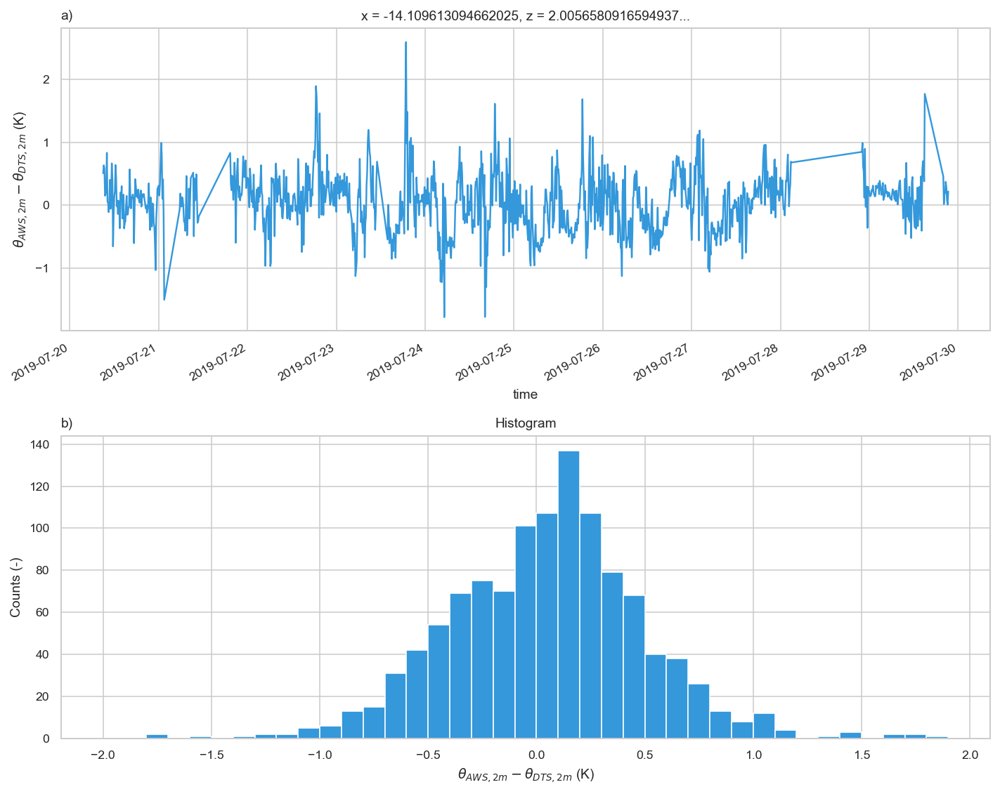

In [99]:
fig, axes = plt.subplots(2, 1, figsize=(10, 8))

ax = axes[0]
(aws_2m_theta_10min - tower_2m_10min).plot(ax=ax)
ax.set_ylabel(r'$\theta_{AWS, 2m} - \theta_{DTS, 2m}$ (K)')
ax.set_title('a)', loc='left')

ax = axes[1]
(aws_2m_theta_10min - tower_2m_10min).plot.hist(ax=ax, bins=np.arange(-2, 2, 0.1))
ax.set_xlabel(r'$\theta_{AWS, 2m} - \theta_{DTS, 2m}$ (K)')
ax.set_title('b)', loc='left')
ax.set_ylabel('Counts (-)')

fig.tight_layout()

Generally there is a small positive bias. I bet that coincides with periods of solar heating. I can convince myself there is a second, smaller negative distribution, which should correspond to radiative cooling at night. I also wonder how this temperature difference corresponds to the temperature gradient (e.g., are we predisposed to a positive gradient when the temperature difference is positive?). There are a lot of interacting variables here... let's just visualize all of them at once.

# 7. Pair plots

Next is to look at the join distributions of cloud cover, Qh, potential temperature, gradient slope (both DTS and sonic), wind speed, LWdwn, SWdwn, and LWnet.

## 7.1 prepare data

First, let's create a data label for each interval to use when labeling the pair plots.

In [100]:
ds = copy.deepcopy(tower_10min)
ds['interval'] = (('time'), np.zeros_like(ds.ols_m))
ds['interval'] = ds['interval'].where((ds['time.hour'] > 5) & (ds['time.hour'] <= 22), 'night')
ds['interval'] = ds['interval'].where((ds['time.hour'] < 5) | (ds['time.hour'] >= 9), 'morning')
ds['interval'] = ds['interval'].where((ds['time.hour'] < 9) | (ds['time.hour'] >= 15), 'day')
ds['interval'] = ds['interval'].where((ds['time.hour'] < 15) | (ds['time.hour'] > 22), 'evening')

Then convert everything to pandas.

In [119]:
ds_10min = xr.merge(
    [
        sonic_10min_sub.theta.sel(names='4m').rename('theta_sonic_4m').drop('z'),
        sonic_10min_sub.wTs.sel(names='4m').rename('wTs_sonic_4m').drop('z'),
        sonic_10min_sub.U_scalar_mean_rot.sel(names='4m').rename('U_sonic_4m').drop('z'),
        tower_10min.b1_slope.mean(dim='draws'),
        ceilo_10min.tcc,
        (aws_2m_theta_10min - tower_2m_10min).rename('theta_diff'),
        aws_2m_theta_10min.rename('AWS_theta_2m'),
        aws_10min['Rlwd (CNR4)'].rename('LWdwn'),
        (aws_10min['Rlwd (CNR4)'] - aws_10min['Rlwu (CNR4)']).rename('LWnet'),
        aws_10min['Rswd (CNR4)'].rename('SWdwn'),
        tower_2m_10min.rename('dts_theta_2m').drop('z'),
        ds['interval'],
    ],
)
df_10min = xr.Dataset.to_dataframe(ds_10min.drop(
    ['names', 'x', 'z', 'LAF', 'northcones', 'unheated', 'southcones', 'y', 'heated', 'eastcones']))
df_10min

,theta_sonic_4m,wTs_sonic_4m,U_sonic_4m,b1_slope,tcc,lnz,theta_diff,AWS_theta_2m,LWdwn,LWnet,SWdwn,dts_theta_2m,interval
time,,,,,,,,,,,,,
2019-05-01 00:00:00,NaN,NaN,NaN,NaN,NaN,0.695972,NaN,NaN,255.30000,-76.80001,0.0,NaN,NaN
2019-05-01 00:10:00,NaN,NaN,NaN,NaN,NaN,0.695972,NaN,NaN,255.10001,-82.10000,0.0,NaN,NaN
2019-05-01 00:20:00,NaN,NaN,NaN,NaN,NaN,0.695972,NaN,NaN,254.70000,-77.40001,0.0,NaN,NaN
2019-05-01 00:30:00,NaN,NaN,NaN,NaN,NaN,0.695972,NaN,NaN,256.60001,-76.00000,0.0,NaN,NaN
2019-05-01 00:40:00,NaN,NaN,NaN,NaN,NaN,0.695972,NaN,NaN,255.89999,-80.20002,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-19 23:20:00,NaN,NaN,NaN,NaN,NaN,0.695972,NaN,NaN,333.35999,-48.35000,0.0,NaN,NaN
2019-08-19 23:30:00,NaN,NaN,NaN,NaN,NaN,0.695972,NaN,NaN,330.92001,-49.76999,0.0,NaN,NaN
2019-08-19 23:40:00,NaN,NaN,NaN,NaN,NaN,0.695972,NaN,NaN,321.92999,-60.13001,0.0,NaN,NaN


Most of the neutral conditions occur in the transition periods. Let's first visualize those.

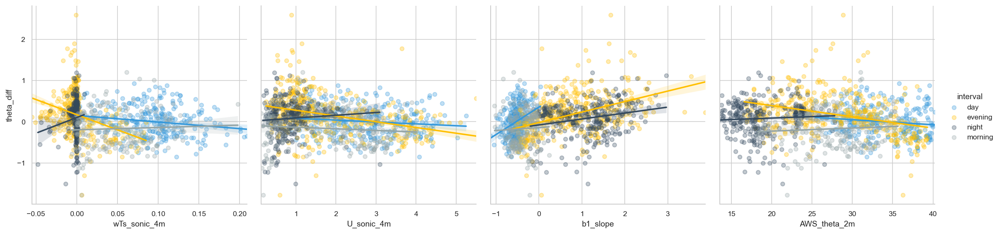

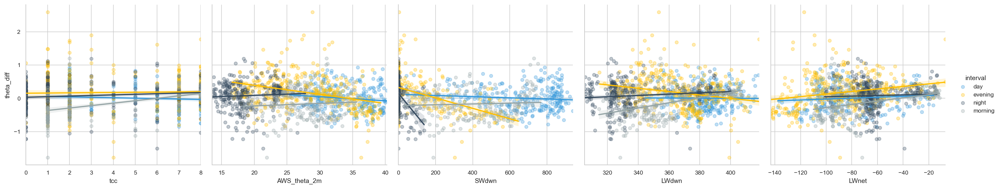

In [127]:
# Turbulence terms
g = sns.PairGrid(
    df_10min,
    y_vars=["theta_diff"],
    x_vars=["wTs_sonic_4m", "U_sonic_4m", 'b1_slope', 'AWS_theta_2m'],
    height=4,
    hue='interval',
)
# g.map(sns.kdeplot, cut=1,)
g.map(sns.regplot, scatter_kws={'alpha':0.3})
g.add_legend()

# Radiation terms
g = sns.PairGrid(
    df_10min,
    y_vars=["theta_diff"],
    x_vars=['tcc', 'AWS_theta_2m', 'SWdwn', 'LWdwn', 'LWnet'],
    height=4,
    hue='interval',
)
# g.map(sns.kdeplot, cut=1, cmap="gray_r")
g.map(sns.regplot, scatter_kws={'alpha': 0.3})
g.add_legend()


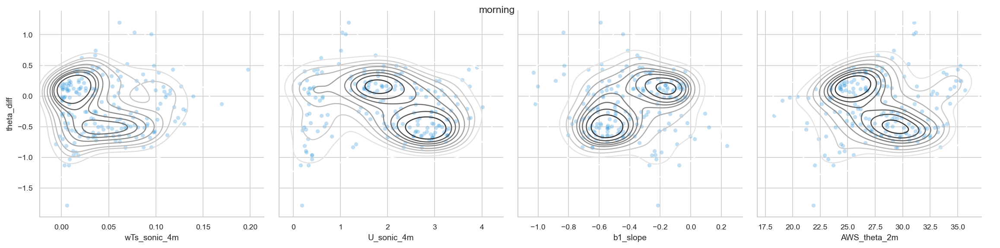

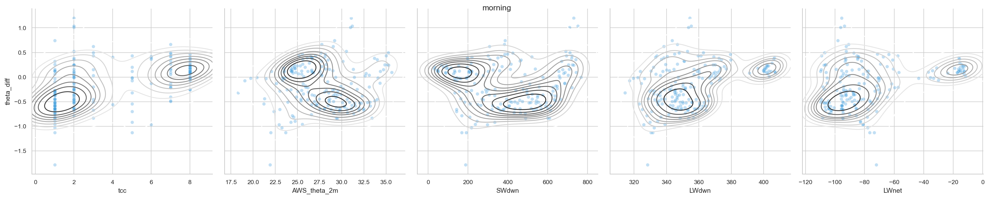

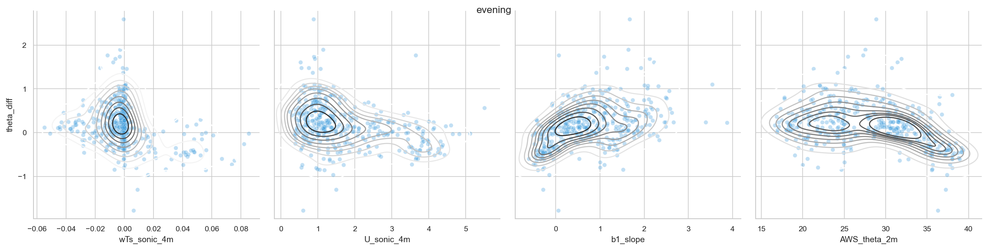

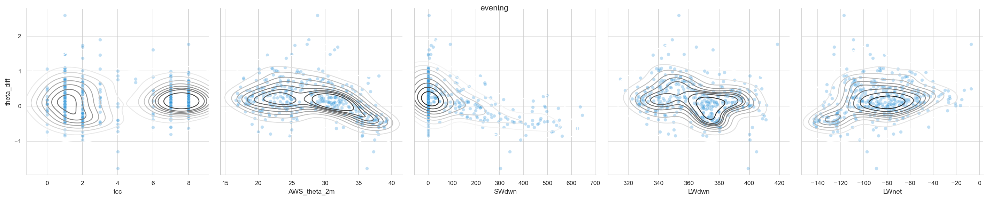

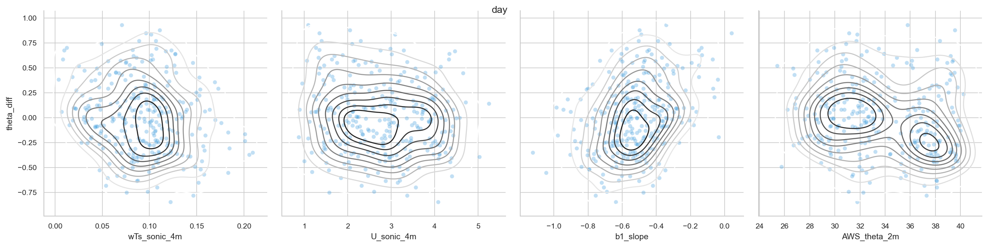

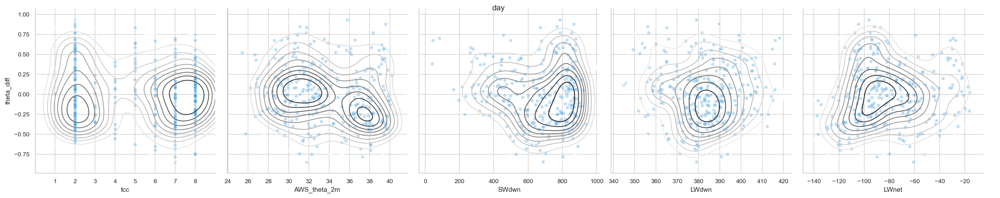

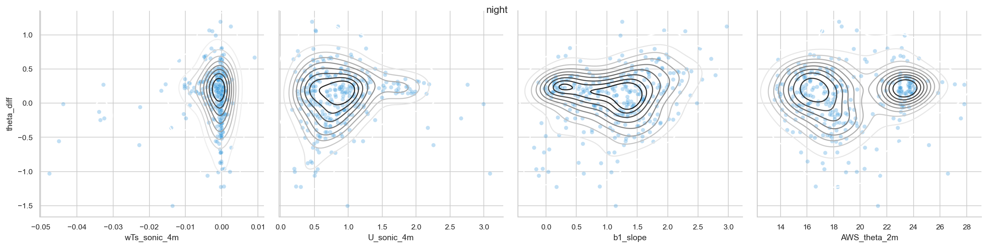

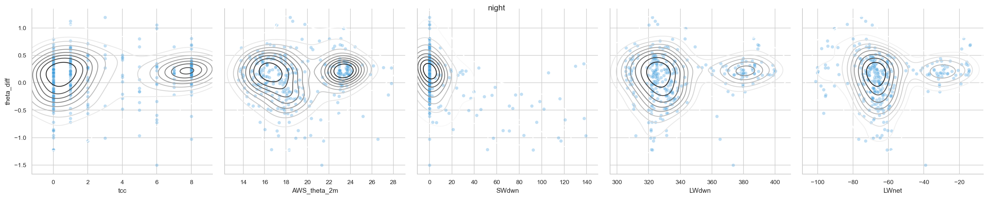

In [137]:
for interval in ['morning', 'evening', 'day', 'night']:
    # Turbulence terms
    g = sns.PairGrid(
        df_10min.where((df_10min.interval == interval)),
        y_vars=["theta_diff"],
        x_vars=["wTs_sonic_4m", "U_sonic_4m", 'b1_slope', 'AWS_theta_2m'],
        height=4,
    )
    g.map(sns.kdeplot, cut=1, cmap="gray_r")
    g.map(sns.scatterplot, alpha=0.3)
    g.add_legend()
    plt.gcf().suptitle(interval + ': turbulence terms')

    # Radiation terms
    g = sns.PairGrid(
        df_10min.where((df_10min.interval == interval)),
        y_vars=["theta_diff"],
        x_vars=['tcc', 'AWS_theta_2m', 'SWdwn', 'LWdwn', 'LWnet'],
        height=4,
    )
    g.map(sns.kdeplot, cut=1, cmap="gray_r")
    g.map(sns.scatterplot, alpha=0.3)
    g.add_legend()
    plt.gcf().suptitle(interval + ': radiation terms')


There are some obvious relationships here, but I believe they may be masked by co-varying physical parameters, e.g. the strong SWdwn corresponds to stronger wind speeds, which counter-act each other in the anticipated artifact on the DTS.

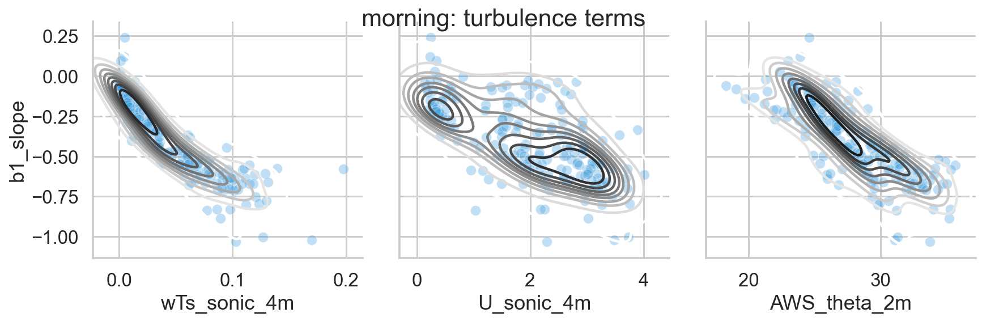

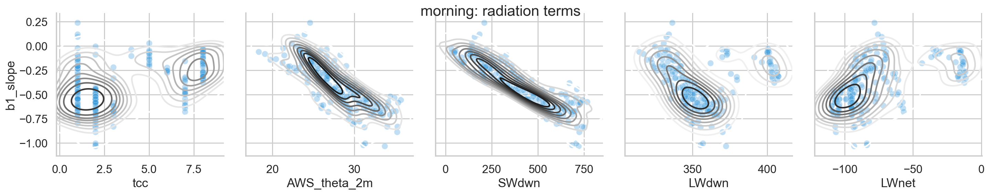

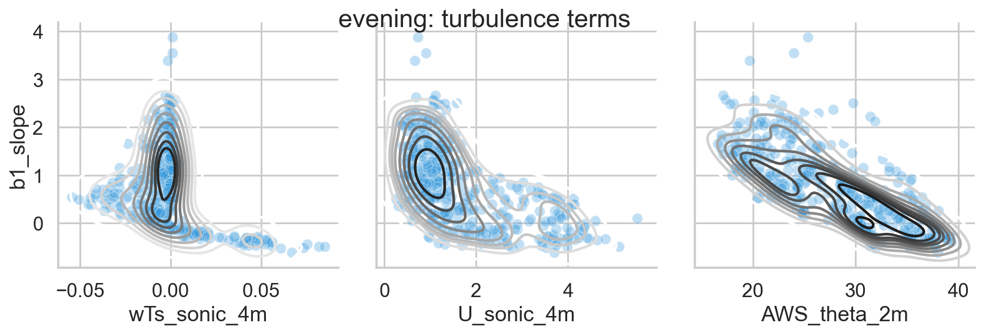

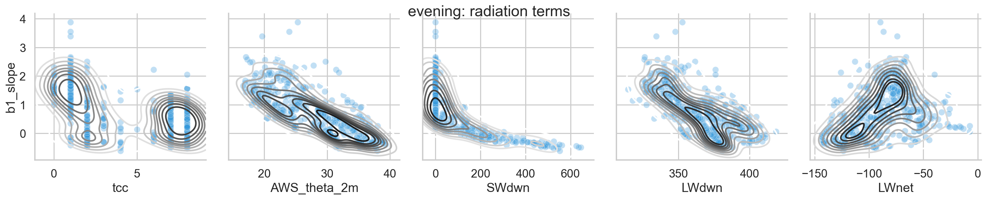

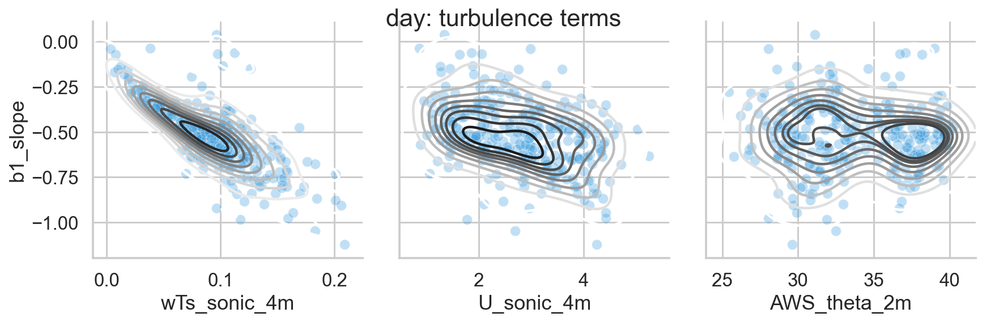

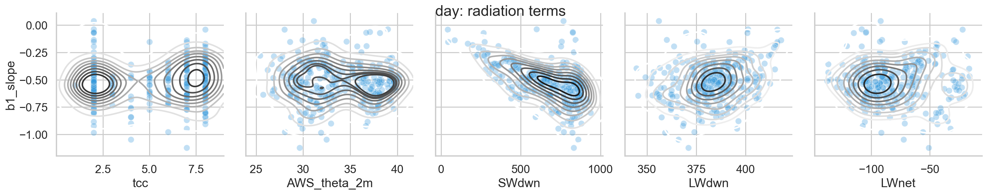

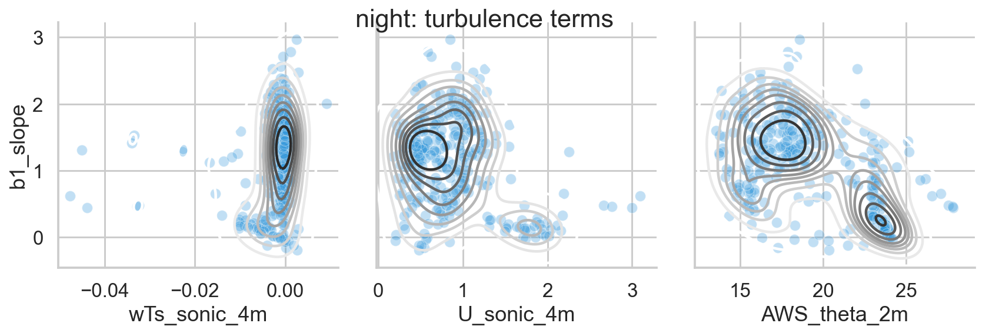

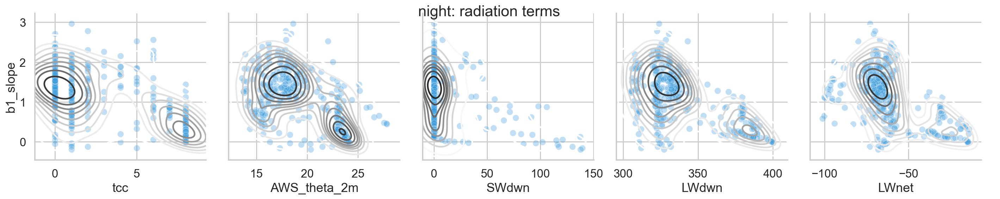

In [143]:
for interval in ['morning', 'evening', 'day', 'night']:
    # Turbulence terms
    g = sns.PairGrid(
        df_10min.where((df_10min.interval == interval)),
        y_vars=["b1_slope"],
        x_vars=["wTs_sonic_4m", "U_sonic_4m", 'AWS_theta_2m'],
        height=4,
    )
    g.map(sns.kdeplot, cut=1, cmap="gray_r")
    g.map(sns.scatterplot, alpha=0.3)
    g.add_legend()
    plt.gcf().suptitle(interval + ': turbulence terms')

    # Radiation terms
    g = sns.PairGrid(
        df_10min.where((df_10min.interval == interval)),
        y_vars=["b1_slope"],
        x_vars=['tcc', 'AWS_theta_2m', 'SWdwn', 'LWdwn', 'LWnet'],
        height=4,
    )
    g.map(sns.kdeplot, cut=1, cmap="gray_r")
    g.map(sns.scatterplot, alpha=0.3)
    g.add_legend()
    plt.gcf().suptitle(interval + ': radiation terms')


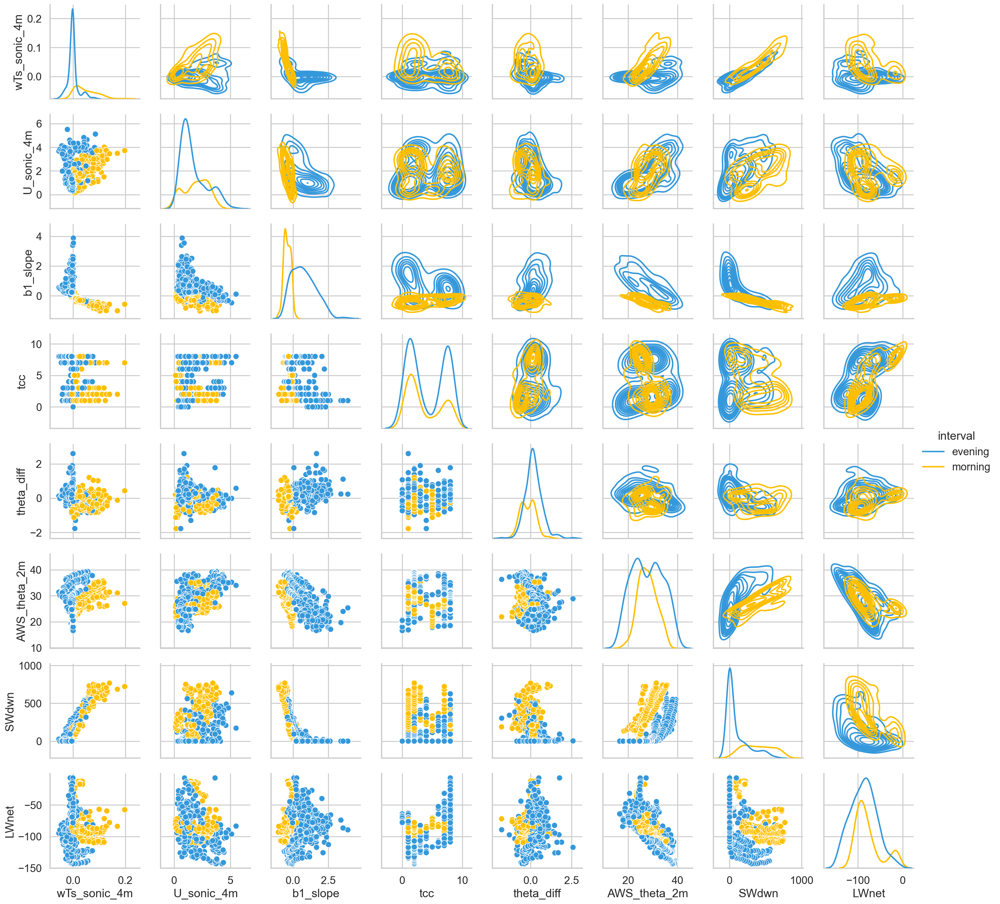

In [139]:
sns.set_context('talk')
grid = sns.PairGrid(
    df_10min.where((df_10min.interval == 'evening') | (df_10min.interval == 'morning')),
    diag_sharey=False,
    hue='interval',
    vars=['wTs_sonic_4m', 'U_sonic_4m', 'b1_slope', 'tcc', 'theta_diff', 'AWS_theta_2m', 'SWdwn', 'LWnet'],
)

# Lower corner = scatter plots
glow = grid.map_lower(sns.scatterplot)
# Histograms on diagonal
gdiag = grid.map_diag(sns.kdeplot)
# Upper corner = KDE plots
gup = grid.map_upper(sns.kdeplot)
grid.add_legend()


To summarize some rather beefy figures, the log-linear slope tends to be more neutral when the wind speeds are larger, when the net longwave is very negative but some sunlight is present, when the difference between the AWS and tower at 2m is zero, when the potential temperature has not transitioned towards it day or night time values, and when the sensible heat flux is small (yay! That one is a necessity for believing the neutral boundary layer). However, there is a _lot_ of spread and co-occuring conditions for these categories.

# Next steps

There are obvious clusters to make here. These clusters may be powerful for correcting errors in the DTS temperatures and for understanding the impact of typical meteorological observations on the stability, which is a major research question in boundary layer meteorology.

# Taking a closer look at the gradients and implications for theory

In [46]:
# From previous work
param_studentt = [0] * 3
param_studentt[0] = 3.053390435630643
param_studentt[1] = -0.0023708708481033312
param_studentt[2] = 0.05457303519244836

theta_star = (ds_sonic.wTs / ds_sonic['u*'])
theta_star_profile_avg = theta_star.mean(dim='names').values

b0_most = ds_bayes_GLM.theta_mean.swap_dims({'xyz': 'z'}).sel(z=0, method='nearest') - theta_star / (0.4 * np.log(z0_t_est))

b1_most = theta_star / (0.4 * np.log(z0_t_est))

b1_guess = b1_most.sel(names='1m')
b0_guess = b0_most.sel(names='1m')

print('Initial guess for the slope={:2.3f}K/ln(m)'.format(b1_guess.values))
print('Initial guess for the intercept={:2.3f}K'.format(b0_guess.values))

Initial guess for the slope=-0.024K/ln(m)
Initial guess for the intercept=22.805K


In [53]:
x = ds_bayes_GLM.lnz
y = ds_bayes_GLM.theta_mean

with pm.Model() as mdl_hogg:

    # state input data as Theano shared vars
    tsv_x = pm.Data("tsv_x", x.values)  # (n, )
    tsv_y = pm.Data("tsv_y", y.values)  # (n, )
    tsv_sigma_y = pm.Data("tsv_sigma_y", param_studentt[2])  # (1, )

    # weakly informative Normal priors (L2 ridge reg) for inliers
    # I want the model to search for an intercept temperature close to what I can estimate
    b0 = pm.Normal("b0_intercept", mu=b0_guess.values, sigma=0.5, testval=pm.floatX(0.0))
    # I don't want the model searching for a slope far away from the initial guess
    b1 = pm.Normal("b1_slope", mu=b1_guess.values, sigma=0.5, testval=pm.floatX(1.0))

    # linear model for mean for inliers
    y_est_in = b0 + b1 * tsv_x  # (n, )

    # very weakly informative mean for all outliers
    y_est_out = pm.Normal("y_est_out", mu=0, sigma=0.6, testval=pm.floatX(0.0))  # (1, )

    # very weakly informative prior for additional variance for outliers
    # The physical interpretation here is that points impacted by artifacts may have
    # a different variance than points impacted by just the atmosphere
    sigma_y_out = pm.HalfNormal("sigma_y_out", sigma=1, testval=pm.floatX(1.0))  # (1, )

    # create in/outlier distributions to get a logp evaluated on the observed y
    # this is not strictly a pymc3 likelihood, but behaves like one when we
    # evaluate it within a Potential (which is minimized)
    inlier_logp = pm.Normal.dist(mu=y_est_in, sigma=tsv_sigma_y).logp(tsv_y)

    outlier_logp = pm.Normal.dist(mu=y_est_out, sigma=tsv_sigma_y + sigma_y_out).logp(tsv_y)

    # frac_outliers only needs to span [0, .5]
    # testval for is_outlier initialised in order to create class asymmetry
    frac_outliers = pm.Uniform("frac_outliers", lower=0.0, upper=0.5)
    is_outlier = pm.Bernoulli(
        "is_outlier",
        p=frac_outliers,
        shape=tsv_x.eval().shape[0],
        testval=(np.random.rand(tsv_x.eval().shape[0]) < 0.3) * 1,
    )  # (n, )

    # non-sampled Potential evaluates the Normal.dist.logp's
    potential = pm.Potential(
        "obs",
        ((1 - is_outlier) * inlier_logp).sum() + (is_outlier * outlier_logp).sum(),
    )

In [54]:
with mdl_hogg:
    trc_hogg = pm.sample(
        tune=5000,
        draws=500,
        chains=2,
        cores=2,
        init="jitter+adapt_diag",
        nuts={"target_accept": 0.9},
        progressbar=True,
    )

Multiprocess sampling (2 chains in 2 jobs)
CompoundStep
>NUTS: [frac_outliers, sigma_y_out, y_est_out, b1_slope, b0_intercept]
>BinaryGibbsMetropolis: [is_outlier]
Sampling 2 chains, 0 divergences: 100%|██████████| 11000/11000 [00:26<00:00, 408.75draws/s]


In [55]:
cutoff = 0.05
ds_bayes_GLM.coords["classed_as_outlier"] = (('xyz'), np.quantile(trc_hogg["is_outlier"], cutoff, axis=0) == 1)
print('Number of Outliers={}'.format(ds_bayes_GLM["classed_as_outlier"].sum().values))

Number of Outliers=14


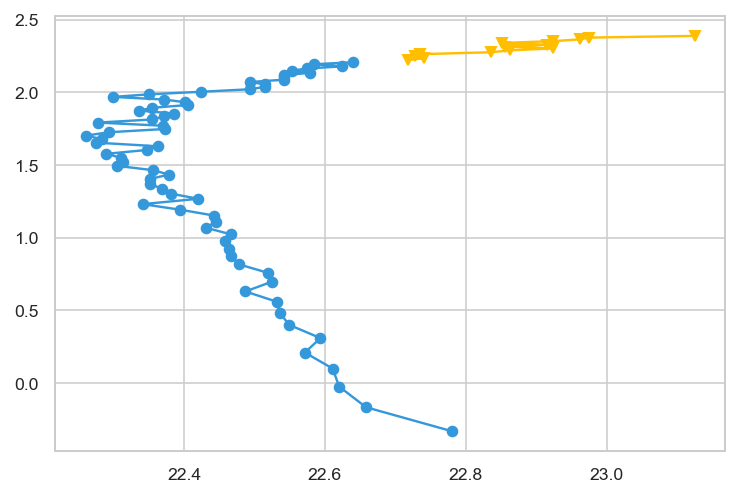

In [56]:
inlier = ds_bayes_GLM.theta_mean.where(ds_bayes_GLM.classed_as_outlier == 0, drop=True)
outlier = ds_bayes_GLM.theta_mean.where(ds_bayes_GLM.classed_as_outlier == 1, drop=True)
plt.plot(inlier.values, inlier.lnz, label='inlier', marker='o')
plt.plot(outlier.values, outlier.lnz, label='outlier', marker='v')


# 9. Modeling MOST with stability corrections directly

In [15]:
# Prepare the period of interest
t_interest = pd.Timestamp('2019-07-27 04:50')
ds_bayes_GLM = tower_10min.sel(time=t_interest)
ds_sonic = sonic_10min.sel(time=t_interest)

In [16]:
def yang_08(ustar, tstar, z0Ground, airTemp, mHeight):
    '''
    As implemented in NoahMPv1.1
    '''
    if np.max(airTemp) < 200:
        airTemp = airTemp + 273.15
    
    # Constants
    beta = 7.2  # m^(-1/2) s^(1/2) K^(-1/4)
    m = 0.5
    n = 0.25
    # Kinematic viscosity (as estimated in Andreas 1987)
    kinvisc = (1. * 10.**7. / (.9065 * airTemp - 112.7)) ** (-1.)

    z0Ground = 70 * kinvisc / ustar * np.exp(-beta * ustar**(m)
                                             * np.abs(tstar)**(n))
    z0Groundh = z0Ground
    z0Groundq = z0Ground

    # Log profiles
    dlogT = np.log(mHeight / z0Groundh)
    dlogQ = np.log(mHeight / z0Groundq)

    return (z0Groundh, z0Groundq, dlogQ, dlogT)

In [18]:
# From processing the CSAT observations using typical micrometeorological approaches
z0 = 0.366667

z0_t_est, _, _, _ = yang_08(
    ds_sonic['u*'].sel(names='1m').values,
    ds_sonic.wTs.sel(names='1m').values,
    z0,
    ds_bayes_GLM.theta_mean.swap_dims({'xyz': 'z'}).sel(z=0, method='nearest').values,
    1.)
print(z0_t_est)

0.019618888644825527


In [20]:
import turbpy


sfcTemp = 290
airTemp = np.arange(275, 315, 0.25)
windspd = 2
mHeight = 2.
z0Ground = z0_t_est
snowDepth = 0.
scalarGroundSnowFraction  = 0.
(airVaporPress, _) = turbpy.satVapPress(airTemp - 273.)
(sfcVaporPress, _) = turbpy.satVapPress(sfcTemp - 273.)
airPress = 95000.

RiBulk = turbpy.bulkRichardson(airTemp, sfcTemp, windspd, mHeight)

# stab_titles are the names given to each stability scheme when plotting. In this example they correspond 
# to the dictionaries that contain the parameter values for each run. T
stab_titles = ('MO (Holtslag/de Bruin)',
               'MO (Holtslag/de Bruin - capped)',
               'MO (Beljaars/Holtslag)',
               'MO (Webb - NoahMP)',
               'MO (Cheng/Brutsaert)',
              )

# A mapping between the titles and the stability methods used in each test.
stab_methods = {'MO (Holtslag/de Bruin)': 'monin_obukhov',
                'MO (Holtslag/de Bruin - capped)': 'monin_obukhov',
                'MO (Beljaars/Holtslag)': 'monin_obukhov',
                'MO (Webb - NoahMP)': 'monin_obukhov',
                'MO (Cheng/Brutsaert)': 'monin_obukhov',
               }

# Thes gradient functions for the Monin-Obukhov methods
gradient_funcs = {'MO (Holtslag/de Bruin)': 'holtslag_debruin',
                  'MO (Holtslag/de Bruin - capped)': 'holtslag_debruin',
                  'MO (Beljaars/Holtslag)': 'beljaar_holtslag',
                  'MO (Beljaars/Holtslag - capped)': 'beljaar_holtslag',
                  'MO (Cheng/Brutsaert)': 'cheng_brutsaert',
                  'MO (Webb - NoahMP)': 'webb_noahmp',
                 }

# Indicates which methods have capping of the conductance. Any method without capping 
# indicated is assumed to have no capping.
capping = {
           'MO (Holtslag/de Bruin - capped)': 'windless_exchange',
          }

# Initialize the multi-level parameter dictionary
stab_dict = {}
stab_dict['stability_params'] = {}

for st in stab_methods:
    stab_dict[st] = {}
    
    # Assigning the stability method
    stab_dict[st]['stability_method'] = stab_methods[st]
    
    # Assigning the gradient method
    if 'monin_obukhov' in stab_methods[st]:
        stab_dict[st]['monin_obukhov'] = {}
        stab_dict[st]['monin_obukhov']['gradient_function'] = gradient_funcs[st]
        
    # Assiging the capping behavior
    if st in capping.keys():
        stab_dict[st]['capping'] = capping[st]


In [21]:
import turbpy.multiConst as mc


# Initialzie dictionaries for containing output
psiH = {}
psiM = {}
L = {}
zeta = {}
zetaT = {}

for stab in stab_titles:
    psiH[stab] = np.zeros_like(RiBulk)
    psiM[stab] = np.zeros_like(RiBulk)
    L[stab] = np.zeros_like(RiBulk)
    zeta[stab] = np.zeros_like(RiBulk)
    zetaT[stab] = np.zeros_like(RiBulk)

    # Get the parameters for running turbpy.
    param_dict = turbpy.parameter_methods.get_params(stab_dict[stab])
    
    for n, (tair, vp) in enumerate(zip(airTemp, airVaporPress)):

        ########
        # Local variables
        volHeatCapacityAir = mc.iden_air * mc.Cp_air              # volumetric heat capacity of air (J m-3)
        latentHeatConstant = mc.iden_air * mc.w_ratio / airPress  # latent heat constant for (kg m-3 Pa-1)

        #######
        # Latent Heat - Vaporization or sublimation.
        # NOTE: The physics implied here may be wrong. Point to bring up with Martyn/Bart
        latHeatSubVapGround = mc.LH_vap
        latHeatSubVapGround = mc.LH_sub

        # compute the gradient/stability corrections
        _, stabOut, _, _ = turbpy.aStability(
            param_dict,                # parameter defining dictionary
            mHeight,         # measurement height (m)
            tair,                   # air temperature @ mHeight (K)
            vp,             # vapor pressure @ mHeight (Pa)
            sfcTemp,                   # ground temperature (K)
            sfcVaporPress,             # vapor pressure @ surface (Pa)
            windspd,                   # wind speed at @ mHeight (m s-1)
            z0Ground,                  # surface roughness length (m)
        )

        # Unpack
        psiH[stab][n] = stabOut['psiH']
        psiH[stab][n] = stabOut['psiH']
        L[stab][n] = stabOut['L']
        zeta[stab][n] = stabOut['zeta']
        zetaT[stab][n] = stabOut['zetaT']
        

/Users/karllapo/anaconda3/envs/py_ml/lib/python3.8/site-packages/turbpy/parameter_methods.py:18: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  param_dict = yaml.load(ymlfile)


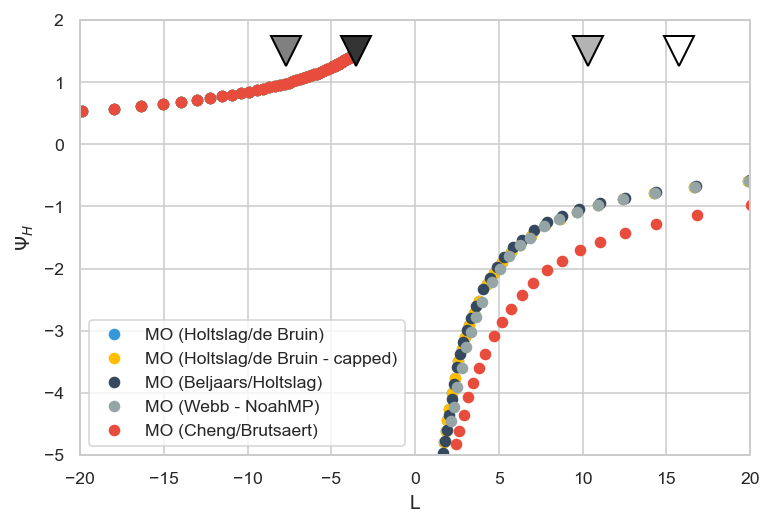

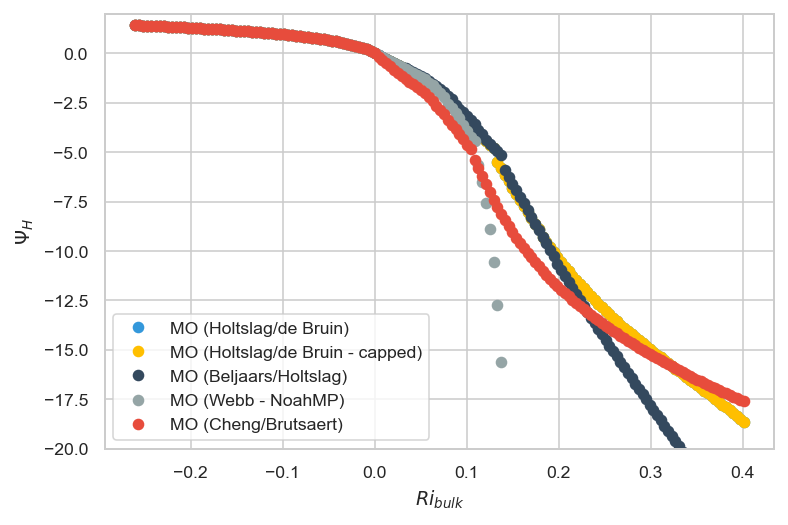

In [38]:
csat_colors = ['0.2', '0.5', '0.7', '1']
fig, ax = plt.subplots(1, 1)
for stab in stab_titles:
    ax.plot(1 / L[stab], psiH[stab], label=stab, marker='o', linestyle='None')
ax.set_ylim(-5, 2)
ax.set_xlim(-20, 20)
ax.set_ylabel(r'$\Psi_H$')
ax.set_xlabel('L')
for n, names in enumerate(ds_sonic.names):
    ax.plot(
        ds_sonic.sel(names=names).L.values,
        1.5, 
        color=csat_colors[n],
        marker='v',
        markersize=15,
        markeredgecolor='k',
        markeredgewidth=1,
        linestyle='None'
    )
ax.legend()

fig, ax = plt.subplots(1, 1)
for stab in stab_titles:
    ax.plot(RiBulk, psiH[stab], label=stab, marker='o', linestyle='None')
ax.set_ylim(-20, 2)
ax.set_ylabel(r'$\Psi_H$')
ax.set_xlabel('$Ri_{bulk}$')
ax.legend()

$\Psi_H$ has the expected behavior change between stable and unstable conditions. This unfortunately has the side effect of making the Bayesian GLM search unstable if I allow the Psi parameter to search on both sides of the behavior. To avoid this, I will do the fit in two parts: 1) fit the lower unstable profile and 2) fit the upper stable profile

I will use the custom likelihood classifier to distinguish between these two.

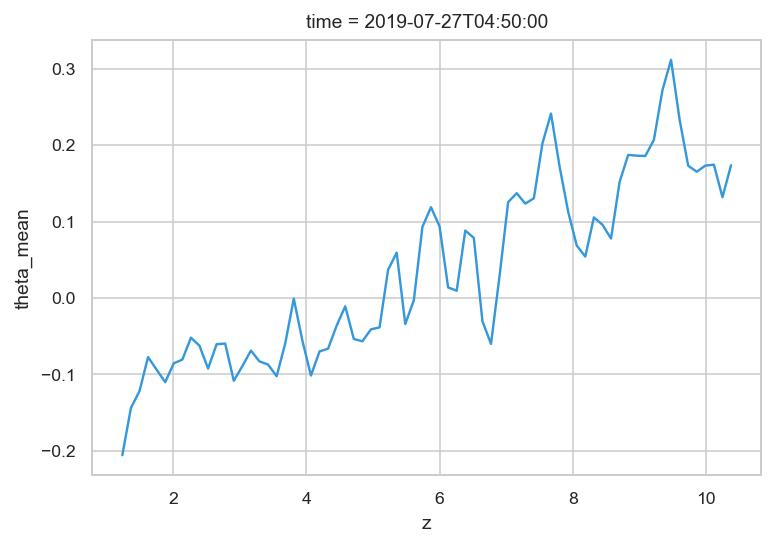

In [57]:
ds_bayes_GLM.theta_mean.swap_dims({'xyz': 'z'}).rolling(z=7, center=True).mean().differentiate(coord='z').plot()

In [58]:
x = inlier.lnz
y = inlier
tstar = theta_star.sel(names='1m')
lnzt = np.log(z0_t_est)
L = ds_sonic.L.sel(names='1m')

with pm.Model() as mdl_stability_studentt:

    # define weakly informative Normal priors to give Ridge regression
    # I want the model to search for an intercept temperature close to what I can estimate
    b0 = pm.Normal("b0_intercept", mu=b0_guess.values, sigma=1)
    # I don't want the model searching for a slope far away from the initial guess
    b1 = pm.Normal("b1_slope", mu=tstar.values, sigma=0.5)
    # The stability correction -- no idea what this is at the moment
    b2 = pm.InverseGamma('b2_correction', mu=1, sigma=1)
    
    # define linear model
    y_est = b0 + (b1 * x) * (1 / z0_t_est - b2 / L)

    # define prior for StudentT degrees of freedom
    # The student t I fit above used a Gamma dist. for degrees of freedom:
    # it's continuous and has support x ∈ (0, inf)
    # I can use the dof defined previously as a starting point.
    # There are two ways to define the distribution:
    #    1) alpha and beta parameters
    #    2) a mean and standard deviation
    # I will use option 2 since I estimated the dof directly, which should
    # correspond to the mean of the distribution.
    nu = pm.Gamma(
        "nu",
        mu=param_studentt[0],
        sigma=2)
   
    # define Student T likelihood
    # The "scale" parameter is given from the above analysis
    likelihood = pm.StudentT(
        "likelihood",
        mu=y_est,
        sigma=param_studentt[2],
        nu=nu,
        observed=y.values)

In [59]:
with mdl_stability_studentt:
    trc_studentt = pm.sample(
        tune=5000,
        draws=500,
        chains=2,
        cores=2,
        init="advi+adapt_diag",
        n_init=50000,
        progressbar=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = 208.18:  28%|██▊       | 14201/50000 [00:02<00:06, 5343.03it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Average Loss = -28.12:  69%|██████▉   | 34601/50000 [00:06<00:02, 6110.35it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [nu, b2_correction, b1_slope, b0_intercept]
Sampling 2 chains, 0 dive

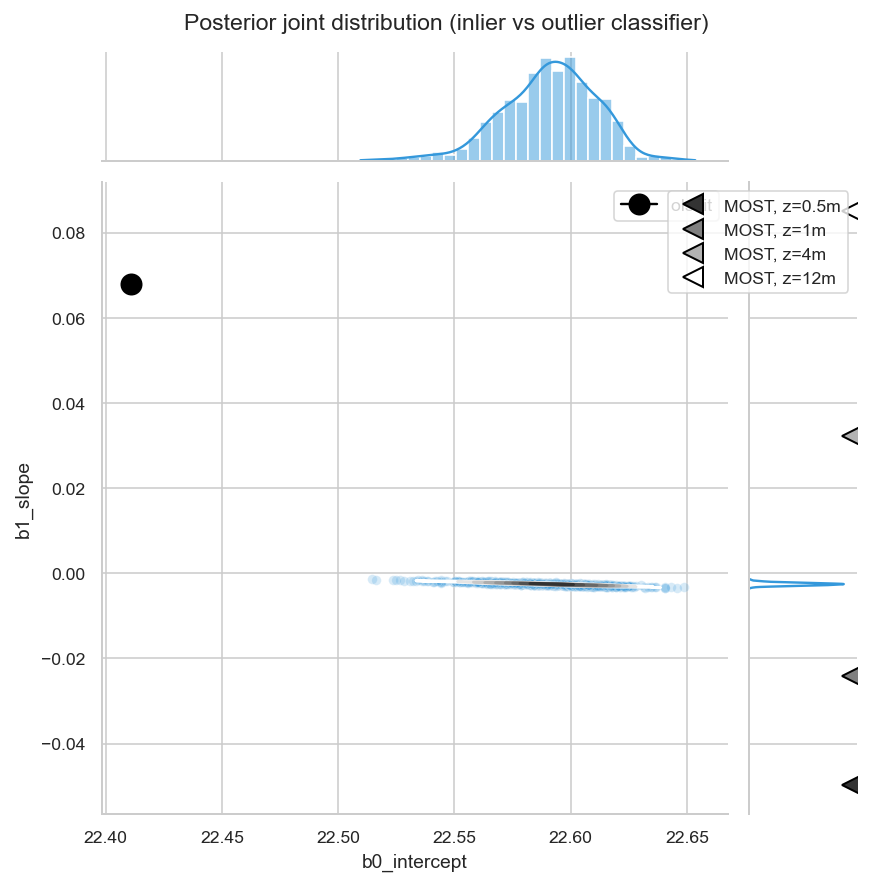

In [60]:
df_trc_multi = pm.trace_to_dataframe(trc_studentt)
gd = sns.jointplot(
    x="b0_intercept",
    y="b1_slope",
    data=df_trc_multi,
    height=6,
    marginal_kws={"kde": True, "kde_kws": {"cut": 1}},
    joint_kws={"alpha": 0.2},
    color=flatui[0],
)
gd.plot_joint(sns.kdeplot, zorder=2, n_levels=10, cmap="gray_r")
_ = gd.fig.suptitle("Posterior joint distribution (inlier vs outlier classifier)", y=1.02)

csat_colors = ['0.2', '0.5', '0.7', '1']
gd.ax_joint.plot(
    ds_bayes_GLM['ols_b'].values,
    ds_bayes_GLM["ols_m"].values,
    marker='o',
    color='k',
    label='ols fit',
    markersize=10
)

_, xloc = gd.ax_marg_y.get_xlim()

for n, names in enumerate(b1_most.names):
    gd.ax_marg_y.plot(
        xloc,
        b1_most.sel(names=names),
        linestyle='None',
        marker='<',
        markeredgecolor='k',
        markeredgewidth=1,
        color=csat_colors[n],
        label='MOST, z={}'.format(names.values),
        markersize=10)
gd.ax_joint.legend()
gd.ax_marg_y.legend()

No handles with labels found to put in legend.


(0.0, 1.5)

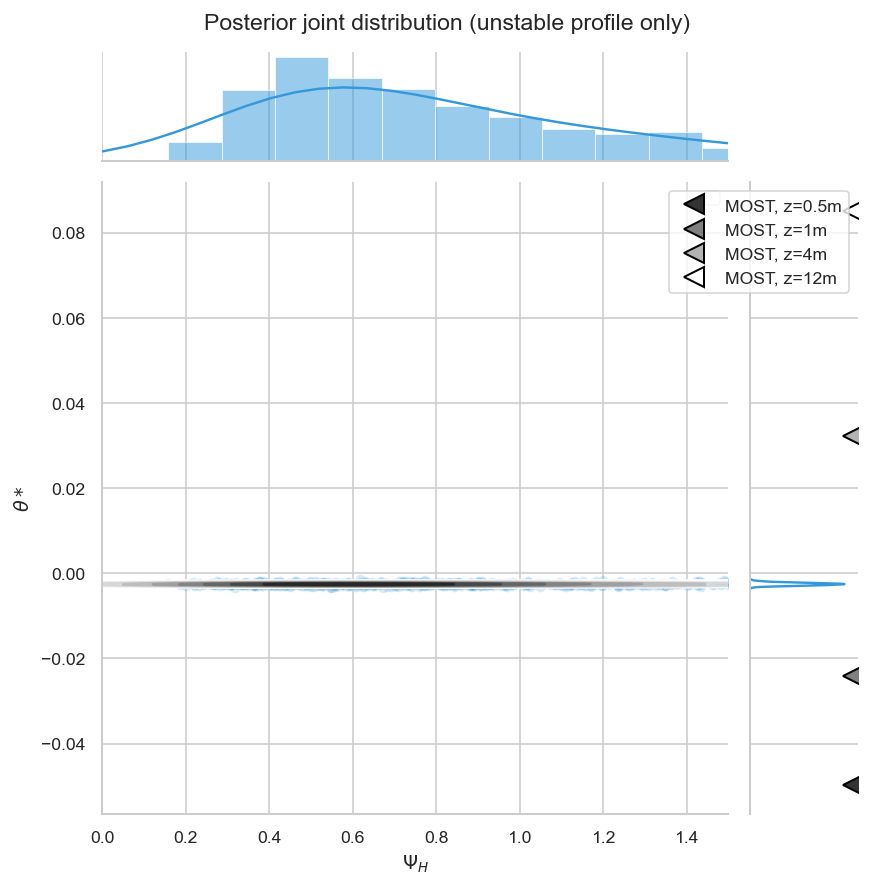

In [61]:
df_trc_multi = pm.trace_to_dataframe(trc_studentt)
gd = sns.jointplot(
    x="b2_correction",
    y="b1_slope",
    data=df_trc_multi,
    height=6,
    marginal_kws={"kde": True, "kde_kws": {"cut": 1}},
    joint_kws={"alpha": 0.2},
    color=flatui[0],
)
gd.plot_joint(sns.kdeplot, zorder=2, n_levels=10, cmap="gray_r")
gd.ax_joint.set_xlabel(r'$\Psi_H$')
gd.ax_joint.set_ylabel(r'$\theta*$')
_ = gd.fig.suptitle("Posterior joint distribution (unstable profile only)", y=1.02)

csat_colors = ['0.2', '0.5', '0.7', '1']
_, xloc = gd.ax_marg_y.get_xlim()

for n, names in enumerate(b1_most.names):
    gd.ax_marg_y.plot(
        xloc,
        b1_most.sel(names=names),
        linestyle='None',
        marker='<',
        markeredgecolor='k',
        markeredgewidth=1,
        color=csat_colors[n],
        label='MOST, z={}'.format(names.values),
        markersize=10)
gd.ax_joint.legend()
gd.ax_marg_y.legend()
gd.ax_joint.set_xlim(0, 1.5)

In [62]:
x = outlier.lnz
y = outlier
tstar = theta_star.sel(names='1m')
lnzt = np.log(z0_t_est)
L = ds_sonic.L.sel(names='1m')

with pm.Model() as mdl_stability_studentt:

    # define weakly informative Normal priors to give Ridge regression
    # I want the model to search for an intercept temperature close to what I can estimate
    b0 = pm.Normal("b0_intercept", mu=b0_guess.values, sigma=1)
    # I don't want the model searching for a slope far away from the initial guess
    b1 = pm.Normal("b1_slope", mu=tstar.values, sigma=0.5)
    # The stability correction -- no idea what this is at the moment
    b2 = pm.InverseGamma('b2_correction', mu=1, sigma=1)
    
    # define linear model
    y_est = b0 + (b1 * x) * (1 / z0_t_est + b2 / L)

    # define prior for StudentT degrees of freedom
    # The student t I fit above used a Gamma dist. for degrees of freedom:
    # it's continuous and has support x ∈ (0, inf)
    # I can use the dof defined previously as a starting point.
    # There are two ways to define the distribution:
    #    1) alpha and beta parameters
    #    2) a mean and standard deviation
    # I will use option 2 since I estimated the dof directly, which should
    # correspond to the mean of the distribution.
    nu = pm.Gamma(
        "nu",
        mu=param_studentt[0],
        sigma=2)
   
    # define Student T likelihood
    # The "scale" parameter is given from the above analysis
    likelihood = pm.StudentT(
        "likelihood",
        mu=y_est,
        sigma=param_studentt[2],
        nu=nu,
        observed=y.values)
    
with mdl_stability_studentt:
    trc_studentt = pm.sample(
        tune=5000,
        draws=500,
        chains=2,
        cores=2,
        init="advi+adapt_diag",
        n_init=50000,
        progressbar=True,
    )
    

Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = 59.793:  29%|██▉       | 14691/50000 [00:02<00:06, 5165.50it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Average Loss = 36.062:  52%|█████▏    | 25799/50000 [00:04<00:04, 5772.17it/s]
Convergence achieved at 25800
Interrupted at 25,799 [51%]: Average Loss = 93.814
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [nu, b2_correction, b1_slope, b0_intercept]
Sampling 2 chains, 0 divergences: 100%|██████████| 11000/11000 [00:43<00:00, 252.94draws/s]
The acceptance probability does not match the target. It is 0.7194922524374292, but should be close to 0.8. Try to increase the number of tuning steps.


No handles with labels found to put in legend.


(0.0, 1.5)

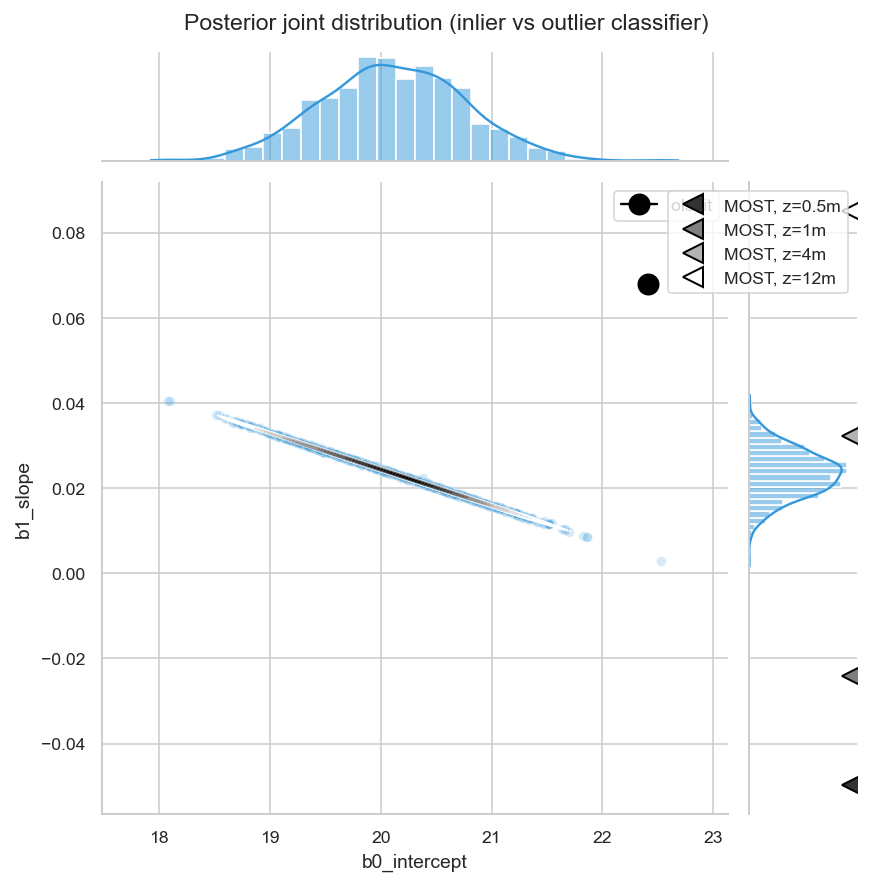

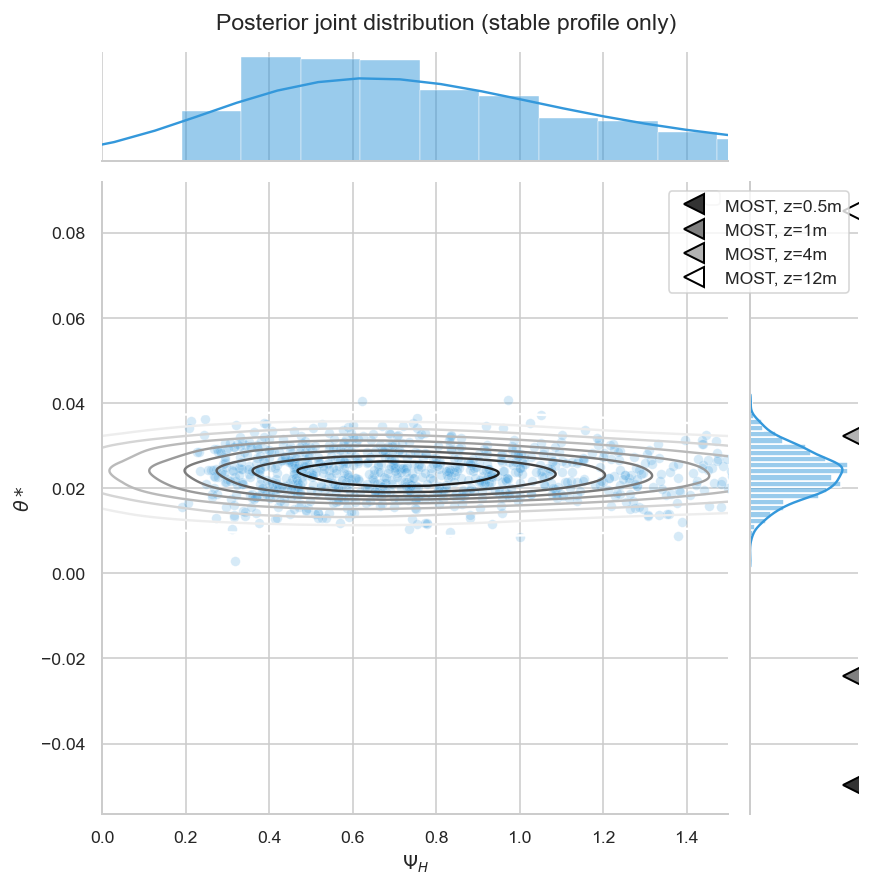

In [63]:
df_trc_multi = pm.trace_to_dataframe(trc_studentt)
gd = sns.jointplot(
    x="b0_intercept",
    y="b1_slope",
    data=df_trc_multi,
    height=6,
    marginal_kws={"kde": True, "kde_kws": {"cut": 1}},
    joint_kws={"alpha": 0.2},
    color=flatui[0],
)
gd.plot_joint(sns.kdeplot, zorder=2, n_levels=10, cmap="gray_r")
_ = gd.fig.suptitle("Posterior joint distribution (inlier vs outlier classifier)", y=1.02)

csat_colors = ['0.2', '0.5', '0.7', '1']
gd.ax_joint.plot(
    ds_bayes_GLM['ols_b'].values,
    ds_bayes_GLM["ols_m"].values,
    marker='o',
    color='k',
    label='ols fit',
    markersize=10
)

_, xloc = gd.ax_marg_y.get_xlim()

for n, names in enumerate(b1_most.names):
    gd.ax_marg_y.plot(
        xloc,
        b1_most.sel(names=names),
        linestyle='None',
        marker='<',
        markeredgecolor='k',
        markeredgewidth=1,
        color=csat_colors[n],
        label='MOST, z={}'.format(names.values),
        markersize=10)
gd.ax_joint.legend()
gd.ax_marg_y.legend()

# -------------------------------------------------------
df_trc_multi = pm.trace_to_dataframe(trc_studentt)
gd = sns.jointplot(
    x="b2_correction",
    y="b1_slope",
    data=df_trc_multi,
    height=6,
    marginal_kws={"kde": True, "kde_kws": {"cut": 1}},
    joint_kws={"alpha": 0.2},
    color=flatui[0],
)
gd.plot_joint(sns.kdeplot, zorder=2, n_levels=10, cmap="gray_r")
gd.ax_joint.set_xlabel(r'$\Psi_H$')
gd.ax_joint.set_ylabel(r'$\theta*$')
_ = gd.fig.suptitle("Posterior joint distribution (stable profile only)", y=1.02)

csat_colors = ['0.2', '0.5', '0.7', '1']
_, xloc = gd.ax_marg_y.get_xlim()

for n, names in enumerate(b1_most.names):
    gd.ax_marg_y.plot(
        xloc,
        b1_most.sel(names=names),
        linestyle='None',
        marker='<',
        markeredgecolor='k',
        markeredgewidth=1,
        color=csat_colors[n],
        label='MOST, z={}'.format(names.values),
        markersize=10)
gd.ax_joint.legend()
gd.ax_marg_y.legend()
gd.ax_joint.set_xlim(0, 1.5)